# Crime Data Analysis and Forecasting using LSTM and Explainability Techniques

This notebook demonstrates the process of analyzing crime data, forecasting future trends using an LSTM model, and interpreting the model's predictions using LIME and SHAP.

# 1. Imports

Let's begin by collecting all the import statements together at the beginning. This ensures that all dependencies are loaded before any logic is executed.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from statsmodels.tsa.seasonal import seasonal_decompose
from lime import lime_tabular
import shap
import os  # Added to handle file paths more robustly


# 2. Loading and Preparing the Dataset

Now, I'll load the dataset and perform some initial data cleaning and transformation:


In [2]:
# Define the file path more robustly using os.path
file_path = os.path.join('/Users', 'arkamandol', 'DataspellProjects', 'Desertation_arka_23023023', 'data_files', 'UK_Police_Street_Crime_2018-10-01_to_2021_09_31.csv')

# Load the data from the specified file path
try:
    df = pd.read_csv(file_path)
except FileNotFoundError:
    print(f"File not found: {file_path}")
    raise
except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    raise

# Display the initial rows of the dataset to understand its structure
df.head()

# 1. Remove any rows where 'Longitude' or 'Latitude' values are missing
df_cleaned = df.dropna(subset=['Longitude', 'Latitude'])

# 2. Focus the dataset on "Violence and sexual offences" crimes
df_cleaned = df_cleaned[df_cleaned['Crime type'] == "Violence and sexual offences"]

# 3. Keep only the necessary columns for analysis
columns_to_keep = ['Month', 'Longitude', 'Latitude']
df_cleaned = df_cleaned[columns_to_keep]


**Explanation**:
- **File Path Handling**: Improved the file path handling with `os.path.join()` for better cross-platform compatibility.
- **Error Handling**: Added exception handling during file loading to catch and report issues like file not found or other IO errors.
- **Data Cleaning**: The data is filtered to remove rows with missing geographical information and focus on specific crime types.


# 3. Time Series Transformation

Here I transform the data into a time series format suitable for analysis.


In [3]:
# Convert the 'Month' column to datetime format for time series analysis
data = df_cleaned.copy()
data['Month'] = pd.to_datetime(data['Month'])

# Set the 'Month' column as the index
data.set_index('Month', inplace=True)

# Aggregate the data to get the number of crimes per month
monthly_crime_count = data.resample('M').size()

# Display the first few entries of the aggregated data
monthly_crime_count.head()


/var/folders/nt/vmygtqvs10vb28qdjwspykv00000gn/T/ipykernel_41701/1584679042.py:9: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_crime_count = data.resample('M').size()


Month
2018-10-31    155135
2018-11-30    147287
2018-12-31    144133
2019-01-31    148395
2019-02-28    140271
Freq: ME, dtype: int64

**Explanation**:
- **Datetime Conversion**: Converts the 'Month' column into a datetime format, which is essential for time series operations.
- **Indexing**: The 'Month' column is set as the index to facilitate resampling and time series analysis.
- **Aggregation**: The number of crimes per month is calculated.


# 4. Visualization of Time Series Data

Next,visualize the monthly crime counts over time.


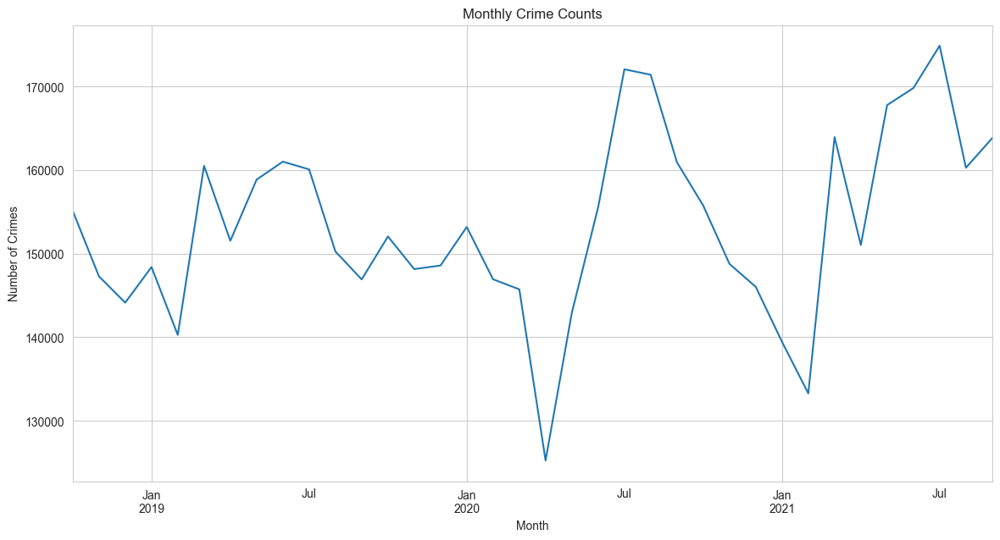

In [4]:
# Generate a line plot to visualize monthly crime counts over time
plt.figure(figsize=(14, 7))
monthly_crime_count.plot()
plt.title('Monthly Crime Counts')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.grid(True)
plt.show()


**Explanation**:
- **Visualization**: A line plot is generated to visualize the crime trend over time, which helps in understanding the data distribution.


# 5. Seasonal Decomposition of Time Series

Decompose the time series to analyze the underlying components:


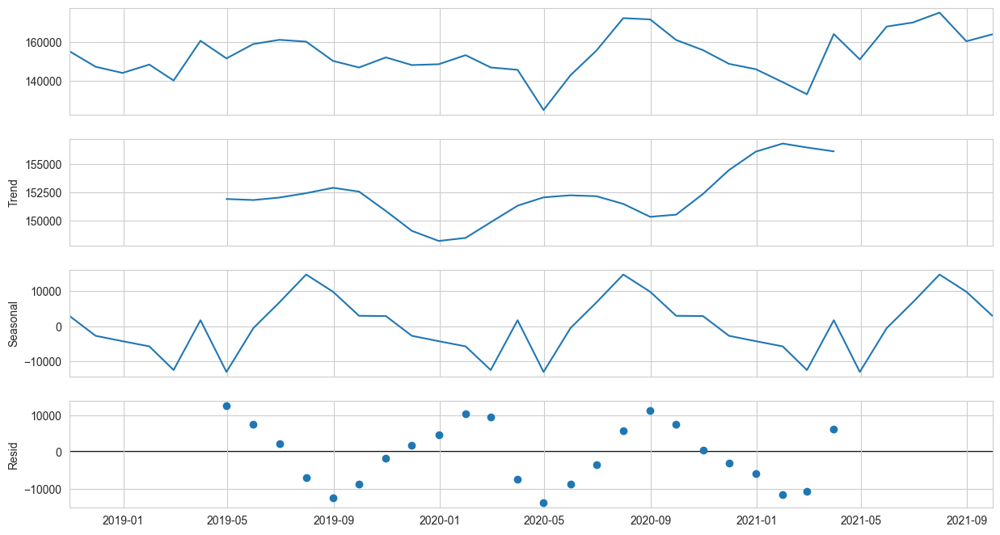

In [5]:
# Decompose the time series into trend, seasonal, and residual components
decomposition = seasonal_decompose(monthly_crime_count, model='additive')

# Plot the decomposed components to better understand the underlying patterns
fig = decomposition.plot()
fig.set_size_inches(14, 7)
plt.show()


**Explanation**:
- **Decomposition**: The time series is decomposed into trend, seasonal, and residual components to identify underlying patterns in the data.


# 6. LSTM Model for Time Series Forecasting

Now need to build and train an LSTM model to predict future crime counts:


In [43]:
# Convert the series to a supervised learning dataset
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:(i + time_step), 0])
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)

# Reshape the data into a format suitable for LSTM
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(monthly_crime_count.values.reshape(-1, 1))

# Create sequences of 12 months (1 year)
time_step = 12
X, Y = create_dataset(scaled_data, time_step)

# Reshape input to be [samples, time steps, features]
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split data into training and testing sets
train_size = int(len(X) * 0.7)
test_size = len(X) - train_size
X_train, X_test = X[:train_size], X[train_size:]
Y_train, Y_test = Y[:train_size], Y[train_size:]


**Explanation**:
- **Supervised Dataset Creation**: The `create_dataset` function converts the time series data into sequences for supervised learning.
    - **Normalization**: The data is scaled between 0 and 1 using MinMaxScaler, which helps in stabilizing the LSTM model training.
- **Train-Test Split**: The dataset is split into training and testing sets, maintaining 70% of the data for training.


# 7. Building the LSTM Model

Let's define, compile, and train the LSTM model:


In [44]:
# Define the LSTM model with dropout
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(Dropout(0.3))  # Adding dropout after the first LSTM layer
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.3))  # Adding dropout after the second LSTM layer
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, Y_train, batch_size=1, epochs=500)


Epoch 1/500
16/16 [==============================] - 2s 4ms/step - loss: 0.1246
Epoch 2/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0584
Epoch 3/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0646
Epoch 4/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0704
Epoch 5/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0670
Epoch 6/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0650
Epoch 7/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0815
Epoch 8/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0642
Epoch 9/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0799
Epoch 10/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0628
Epoch 11/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0492
Epoch 12/500
16/16 [==============================] - 0s 3ms/step - loss: 0.0674
Epoch 13/500
16/16 [=================

**Explanation**:
- **Model Architecture**: A Sequential LSTM model is defined with two LSTM layers, each followed by a Dropout layer to prevent overfitting. The model ends with Dense layers to produce the final output.
- **Compilation**: The model is compiled with the Adam optimizer and mean squared error loss function.
- **Training**: The model is trained with a small batch size and a large number of epochs for better learning.


# 8. Making Predictions and Evaluating the Model

After training,predict and evaluate the model:


In [45]:
# Predict using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform the predictions to original scale
train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
Y_train = scaler.inverse_transform([Y_train])
Y_test = scaler.inverse_transform([Y_test])

# Calculate MSE, RMSE and MAE for training and testing data
train_mse = mean_squared_error(Y_train.T, train_predict)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(Y_train.T, train_predict)
test_mse = mean_squared_error(Y_test.T, test_predict)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(Y_test.T, test_predict)

print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAE: {test_mae}')


1/1 [==============================] - 0s 19ms/step
Train MSE: 11264257.066513062
Train RMSE: 3356.2266113170995
Train MAE: 2169.6826171875
Test MSE: 314326459.65756226
Test RMSE: 17729.254345785732
Test MAE: 15974.892578125


**Explanation**:
- **Predictions**: The model is used to predict both the training and testing data.
- **Inverse Scaling**: The predictions are transformed back to the original scale.
- **Evaluation**: Mean Squared Error (MSE), Root Mean Squared Error (RMSE), and Mean Absolute Error (MAE) are calculated to evaluate model performance.


# 9. Future Predictions

Predicting crime counts for the next 6 months:


In [46]:
# Predict the next 6 months (October 2021 to March 2022)
future_steps = 6
future_predictions = []
last_sequence = X[-1]  # The last sequence of the test set

for _ in range(future_steps):
    next_pred = model.predict(last_sequence.reshape(1, time_step, 1))
    future_predictions.append(next_pred[0, 0])
    last_sequence = np.append(last_sequence[1:], next_pred, axis=0)

# Inverse transform future predictions
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

# Generate date range for predictions
last_date = monthly_crime_count.index[-1]
future_dates = pd.date_range(last_date + pd.DateOffset(months=1), periods=future_steps, freq='M')


1/1 [==============================] - 0s 18ms/step


/var/folders/nt/vmygtqvs10vb28qdjwspykv00000gn/T/ipykernel_41701/3766325456.py:16: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  future_dates = pd.date_range(last_date + pd.DateOffset(months=1), periods=future_steps, freq='M')


**Explanation**:
- **Future Predictions**: The model is used to predict the next 6 months of crime counts.
- **Date Range Generation**: A corresponding date range is generated for the predicted values.


# 10. Visualization of Predictions

Plotting actual vs predicted crime counts:


/var/folders/nt/vmygtqvs10vb28qdjwspykv00000gn/T/ipykernel_41701/2701620142.py:18: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  plt.gca().set_xticks(pd.date_range(start=monthly_crime_count.index[0], end=future_dates[-1], freq='M'))
/var/folders/nt/vmygtqvs10vb28qdjwspykv00000gn/T/ipykernel_41701/2701620142.py:22: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pd.date_range(start=monthly_crime_count.index[0], end=future_dates[-1], freq='M')])


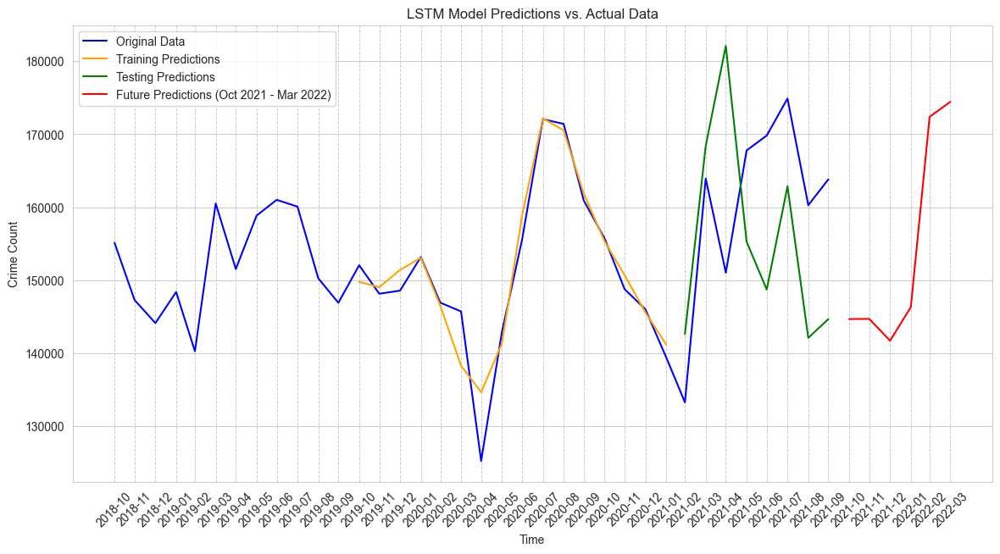

In [47]:
# Plot the results
plt.figure(figsize=(14, 7))
plt.plot(monthly_crime_count.index, monthly_crime_count.values, label='Original Data', color='blue')
plt.plot(monthly_crime_count.index[time_step:time_step + len(train_predict)], train_predict,
         label='Training Predictions', color='orange')
plt.plot(monthly_crime_count.index[time_step + len(train_predict):time_step + len(train_predict) + len(test_predict)],
         test_predict, label='Testing Predictions', color='green')
plt.plot(future_dates, future_predictions, label='Future Predictions (Oct 2021 - Mar 2022)', color='red')

plt.title('LSTM Model Predictions vs. Actual Data')
plt.xlabel('Time')
plt.ylabel('Crime Count')
plt.xticks(rotation=45)
plt.grid(True, which='both', axis='x', linestyle='--', linewidth=0.7)
plt.legend()

# Set the x-ticks to be all months in the range
plt.gca().set_xticks(pd.date_range(start=monthly_crime_count.index[0], end=future_dates[-1], freq='M'))

# Format the x-ticks to show month and year
plt.gca().set_xticklabels([date.strftime('%Y-%m') for date in
                           pd.date_range(start=monthly_crime_count.index[0], end=future_dates[-1], freq='M')])

plt.show()


**Explanation**:
- **Visualization**: The plot compares the original data with both the training/testing predictions and future predictions, showing how well the model fits and forecasts.


# 11. LIME for Model Interpretability

Using LIME to explain the predictions of the LSTM model:


157/157 [==============================] - 0s 3ms/step
Explanation for instance 0:


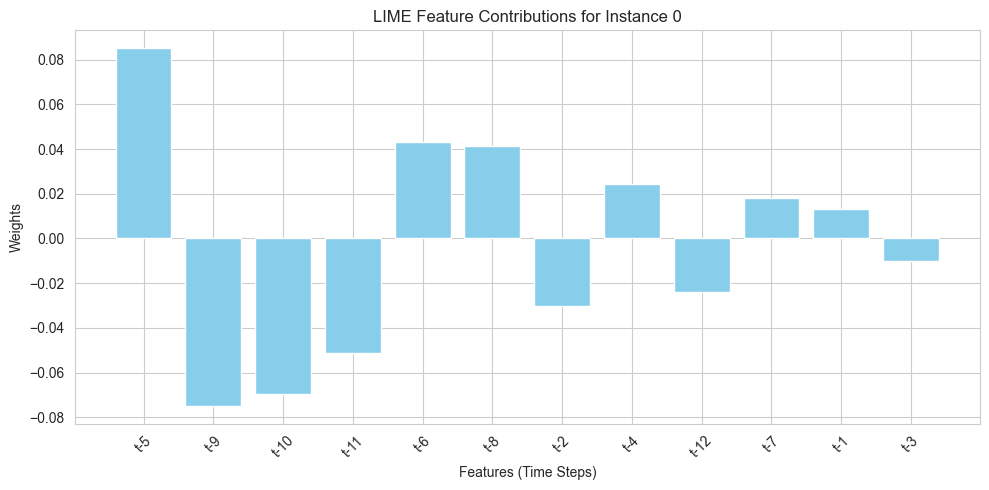

157/157 [==============================] - 0s 3ms/step
Explanation for instance 1:


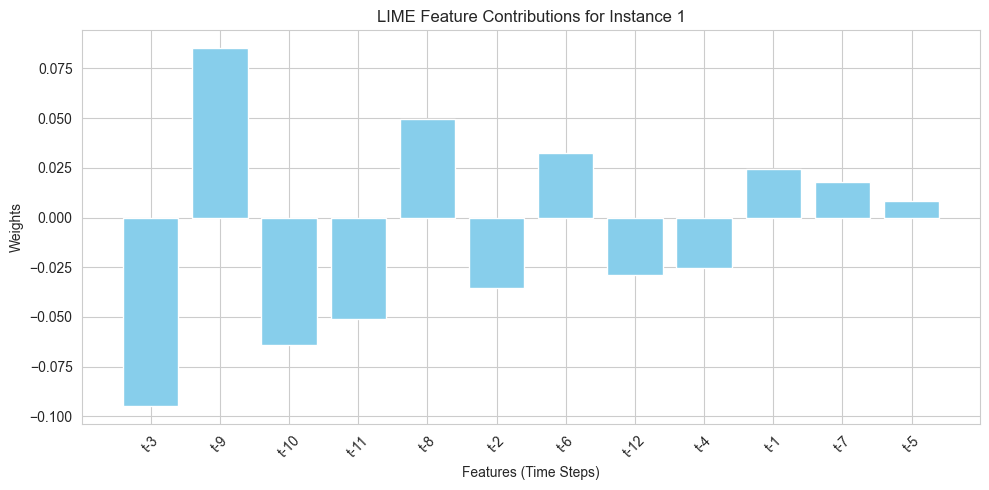

157/157 [==============================] - 1s 5ms/step
Explanation for instance 2:


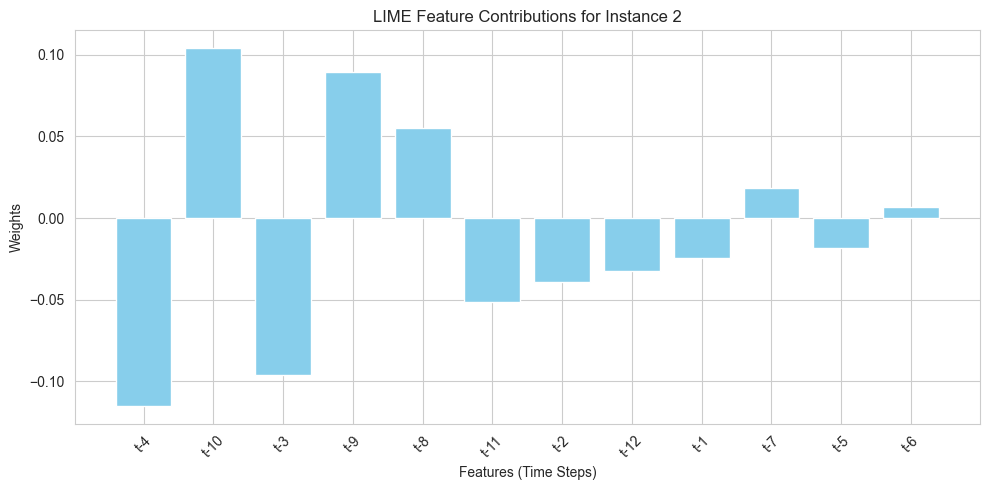

157/157 [==============================] - 1s 4ms/step
Explanation for instance 3:


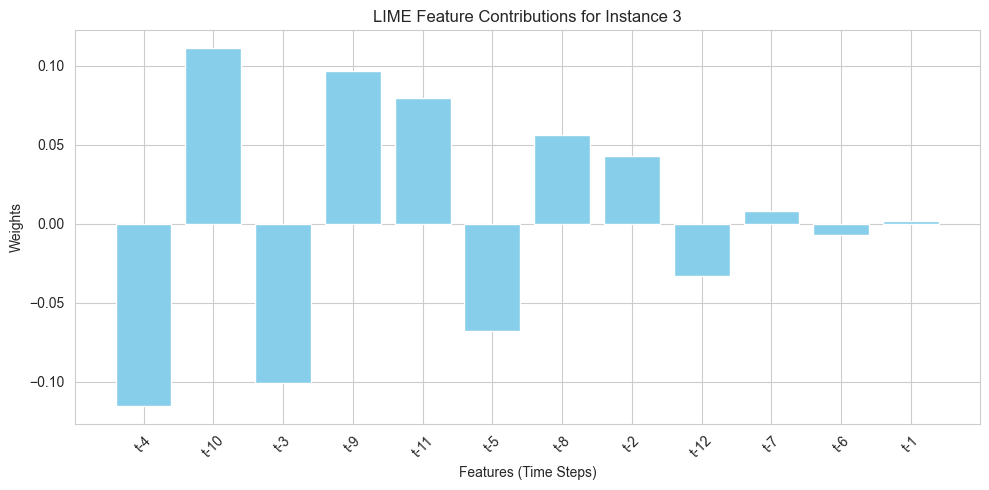

157/157 [==============================] - 1s 3ms/step
Explanation for instance 4:


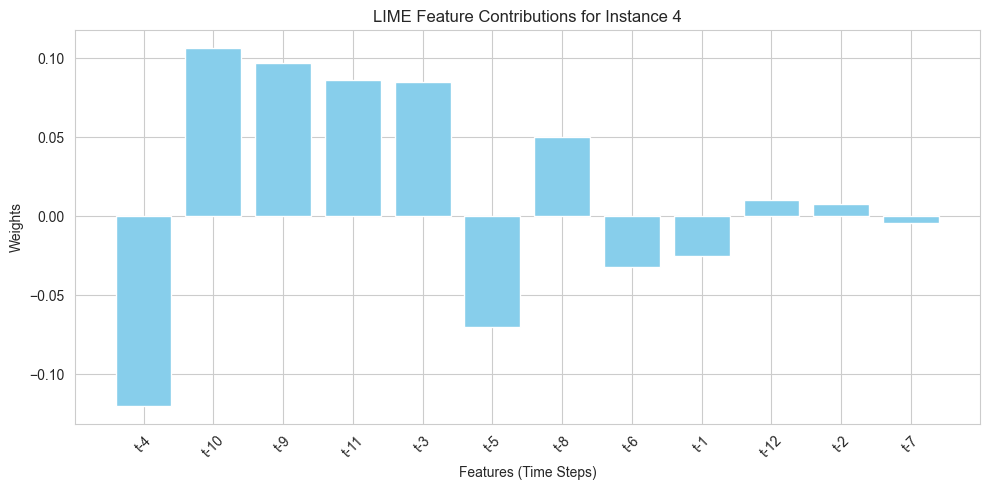

157/157 [==============================] - 1s 5ms/step
Explanation for instance 5:


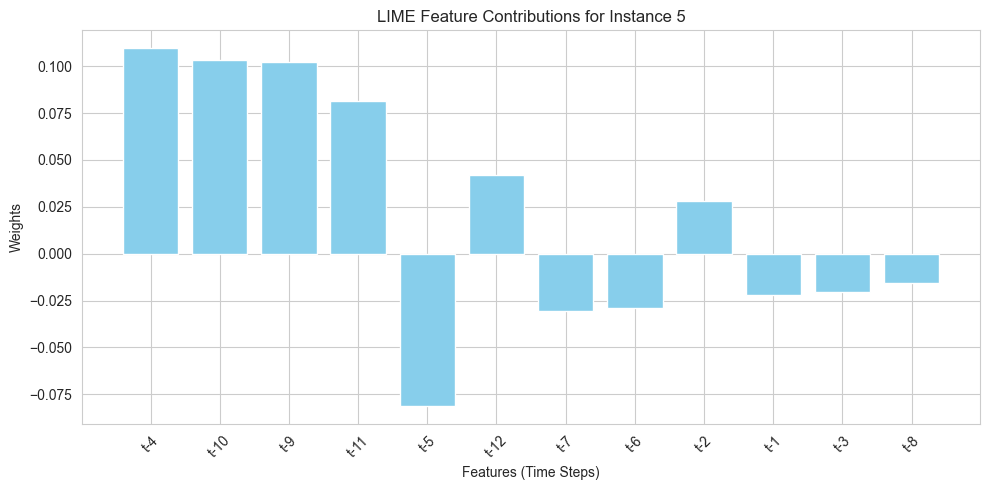

157/157 [==============================] - 1s 5ms/step
Explanation for instance 6:


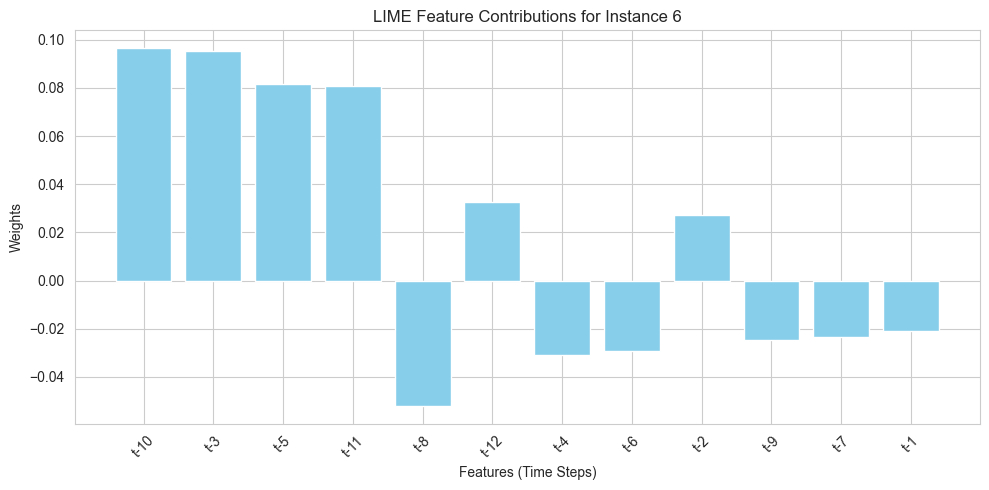

157/157 [==============================] - 1s 3ms/step
Explanation for instance 7:


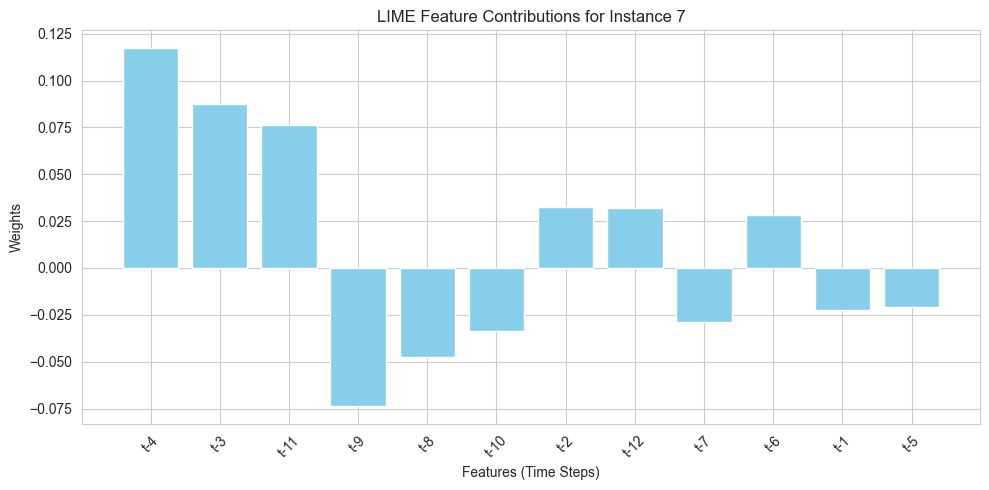

In [48]:
# Define the prediction function for LIME
def lstm_predict(input_data):
    """ Wrapper function to adapt input data for the LSTM model's expected input shape """
    reshaped_data = input_data.reshape(input_data.shape[0], time_step, 1)  # Reshape to [samples, time steps, features]
    return model.predict(reshaped_data)

# Reshape X_train for LIME
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[1])

# Initialize the LIME Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_2d,
    feature_names=['t-' + str(i) for i in range(X_train.shape[1])],  # Create feature names for each time step
    mode='regression'
)

# Loop through each instance in X_test
lime_explanations = []

for i in range(X_test.shape[0]):
    # Reshape test instance to 2D for LIME
    test_instance = X_test[i].reshape(1, -1)[0]

    # Generate explanation for the current instance
    exp = explainer.explain_instance(
        data_row=test_instance,
        predict_fn=lstm_predict,
        num_features=12  # Set this to ensure all features are considered
    )

    lime_explanations.append(exp)

    # Optionally, print or plot each explanation
    print(f"Explanation for instance {i}:")
    exp.show_in_notebook(show_table=True, show_all=False)

    # Plotting each explanation
    features, weights = zip(*[(i[0], i[1]) for i in exp.local_exp[0]])
    features = [f"t-{X_train.shape[1] - idx}" for idx in features]

    plt.figure(figsize=(10, 5))
    plt.bar(features, weights, color='skyblue')
    plt.xlabel('Features (Time Steps)')
    plt.ylabel('Weights')
    plt.title(f'LIME Feature Contributions for Instance {i}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


**Explanation**:
- **LIME Explanation**: The code uses LIME to interpret the LSTM model’s predictions, identifying the most influential features for each prediction.


# 12. SHAP for Model Interpretability

Lastly, SHAP is used to interpret the model:


1/1 [==============================] - 0s 46ms/step


  0%|          | 0/8 [00:00<?, ?it/s]

50/50 [==============================] - 0s 3ms/step


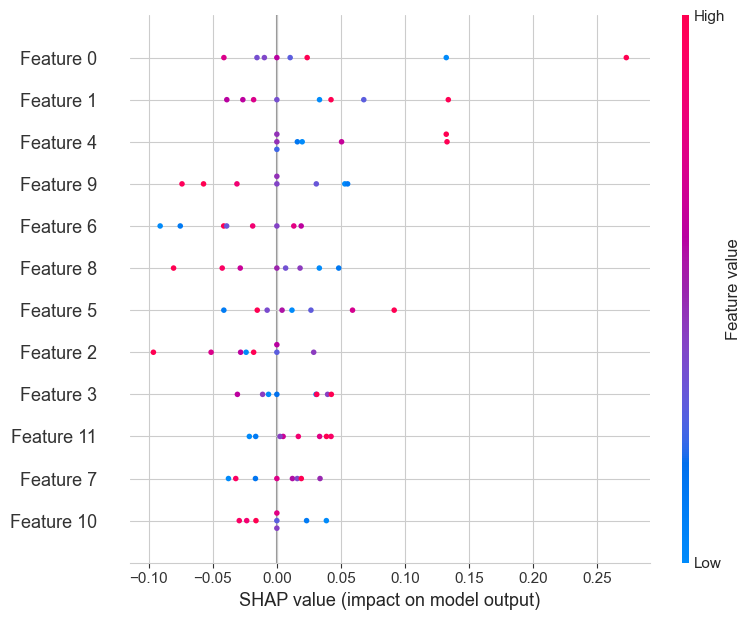

In [49]:
# Define a custom prediction function that reshapes the input before predicting
def predict_reshaped(data):
    reshaped_data = data.reshape(data.shape[0], -1, 1)
    return model.predict(reshaped_data)

# Use a small subset of training data as background for KernelExplainer
background = X_train.reshape(X_train.shape[0], -1)  # Flatten to 2D for KernelExplainer

# Initialize KernelExplainer with the custom predict function
explainer = shap.KernelExplainer(predict_reshaped, background)

# Compute SHAP values for test set (reshaped to 2D)
X_test_2d = X_test.reshape(X_test.shape[0], -1)  # Flatten to 2D
shap_values = explainer.shap_values(X_test_2d, nsamples=100)

# Reshape SHAP values from (8, 12, 1) to (8, 12)
shap_values_reshaped = np.array(shap_values).reshape(X_test.shape[0], X_test.shape[1])

# Now use SHAP's summary plot, passing in the original X_test without the last dimension
X_test_reshaped = X_test.reshape(X_test.shape[0], X_test.shape[1])  # Remove the last dimension
shap.summary_plot(shap_values_reshaped, X_test_reshaped)
